In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from heapq import nsmallest, nlargest
import seaborn as sns
from pandas import DataFrame
import sys # Prevents errors in some facetgrid calls
from mpl_toolkits.mplot3d import Axes3D

from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_validate, RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn import metrics

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, MaxPooling2D, Reshape, LSTM
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
from keras.backend import clear_session
from keras.preprocessing.image import ImageDataGenerator
from kerastuner.tuners import RandomSearch

from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras import layers

import tensorflow as tf
print(f"Number of GPUs available : {len(tf.config.experimental.list_physical_devices('GPU'))} ")

## Modify dataset for qualitative features

In [2]:
# https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients
dataframe = pd.read_csv('default of credit card clients.csv', encoding="utf-8", header=1)
df = dataframe.copy(deep=True) # Make a deep copy so as not to modify the origional dataset
df['EDUCATION'].loc[(df['EDUCATION'] > 4)] = 4
df['EDUCATION'].loc[(df['EDUCATION'] == 0)] = 4
df['MARRIAGE'].loc[(df['MARRIAGE'] >2)] = 3
df['MARRIAGE'].loc[(df['MARRIAGE'] ==0)] = 3

## Add new features as justified by other data exploration notebook

In [3]:
# Before we continue, define some helper functions!

def accumulateLogSum_noTarget(a,colname):
    row_sum = [] # Each element is sum (log(sum x))
    for _,row in a.iterrows(): # Sum all the columns for each row, each apply log to each element.
        row_s = 0
        for x in row:
            if x>0:
                row_s += np.log1p(x)
            elif x<0:
                row_s += -(np.log1p(-x))
            else:
                row_s += 0
        row_sum.append(row_s)
    col = DataFrame(row_sum,columns=[colname])
    return col

def show(finalDF, azi, angle):
    fig = plt.figure()
    ax = Axes3D(fig)
    colrMap = 'RdBu'
    ax.set_xlabel('PC1', fontsize=20)
    ax.set_ylabel('PC2', fontsize=20)
    ax.set_zlabel('PC3', fontsize=20)
    ax.scatter(
        finalDF.loc[:,'principal component 1'],finalDF.loc[:,'principal component 2'],finalDF.loc[:,'principal component 3'],
        c = finalDF.loc[:,'default payment next month'],
        cmap = colrMap,
        s = 1
    )
    ax.grid()
    ax.view_init(elev=angle, azim=azi)

    plt.show()

In [4]:
pay = df.iloc[:, 6:12]
paydf = accumulateLogSum_noTarget(pay, 'PAY_LOGSUM')
bill = df.iloc[:,12:18]
billdf = accumulateLogSum_noTarget(bill, 'BILL_LOGSUM')
payamt = df.iloc[:, 18:24]
payamtdf = accumulateLogSum_noTarget(payamt, 'PAYAMT_LOGSUM')
target_tmp = df.iloc[:,-1]
firstcols = df.iloc[:,:6]
newdf = pd.concat([firstcols,pay,paydf,bill,billdf,payamt,payamtdf,target_tmp], axis=1)

## PCA Reduction

### 1) Seperate out the features

In [5]:
# Seperate out the features
features = newdf.iloc[:, 1:27] # Seperate out the features
print(features.columns)

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'PAY_LOGSUM', 'BILL_AMT1',
       'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
       'BILL_LOGSUM', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4',
       'PAY_AMT5', 'PAY_AMT6', 'PAYAMT_LOGSUM'],
      dtype='object')


### 2) Standardize the data then obtain 2 principal components

In [6]:
# Here we standardize our data as PCA is affected by scale,
# so use StandardScaler to standardize this onto a unit scale (mean=0, variance=1)
x = features.values
x = StandardScaler().fit_transform(x) # Standardize the features x

pca_2 = PCA(n_components=2) # 2 principal components instead of 1 to keep more fidelity in our data
principalComponents_2 = pca_2.fit_transform(x) # Fit our 24D features into a 2D data (2 columns)

# Transform our 24D data into a 2D dataframe with targets y being hospitalizations from origional dataframe
principalDF_2 = pd.DataFrame(
    data = principalComponents_2,
    columns = ['principal component 1','principal component 2']
)

finalDF_2 = pd.concat([principalDF_2, df[['default payment next month']]], axis=1)
print(finalDF_2)

       principal component 1  principal component 2  \
0                  -2.467647              -1.421686   
1                  -0.381129              -2.385765   
2                  -0.373747              -1.173548   
3                   0.233485              -0.821293   
4                  -0.521031              -0.074350   
...                      ...                    ...   
29995               2.637345               1.143175   
29996              -1.982638              -0.272305   
29997               1.034436              -3.449508   
29998               0.660616               0.909958   
29999               0.269649              -0.815150   

       default payment next month  
0                               1  
1                               1  
2                               0  
3                               0  
4                               0  
...                           ...  
29995                           0  
29996                           0  
29997          

### 3) Remove outliers, since outliers makes the visualization difficult

In [7]:
print(f'Number of rows with outliers: {len(finalDF_2)}')
finalDF_2 = finalDF_2[(np.abs(stats.zscore(finalDF_2)) < 2.9).all(axis=1)]
print(f'Number of rows without outliers: {len(finalDF_2)}')

Number of rows with outliers: 30000
Number of rows without outliers: 29425


In [8]:
finalDF_2.describe()

,principal component 1,principal component 2,default payment next month
count,29425.000000,29425.000000,29425.000000
mean,-0.149315,-0.042967,0.217638
std,2.558420,1.897248,0.412647
min,-6.191214,-6.256056,0.000000
25%,-2.072175,-1.161140,0.000000
50%,-0.105576,-0.026830,0.000000
75%,1.391101,1.114418,0.000000
max,8.104206,6.282662,1.000000


### 4) Visualize the 2D projection

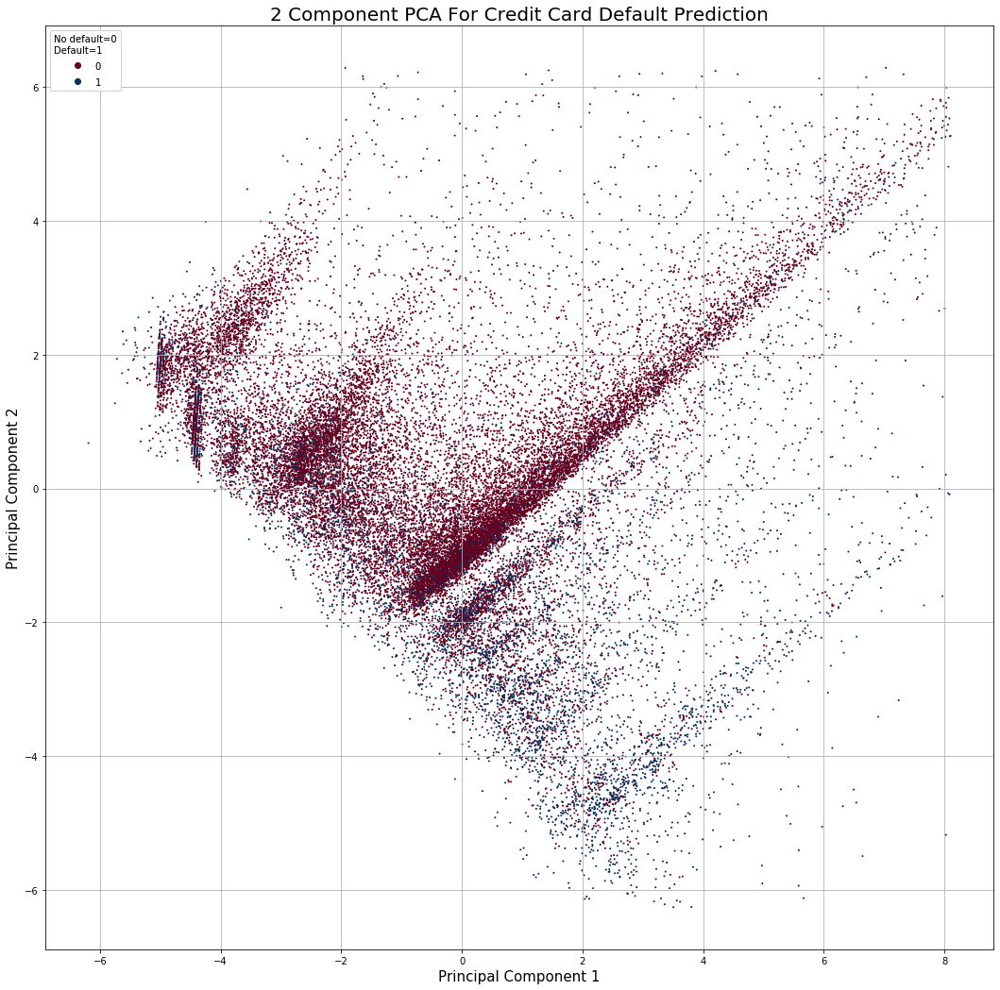

In [9]:
# Now we visualize the 2D projection.
fig, ax = plt.subplots(figsize=(18,18))
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA For Credit Card Default Prediction', fontsize = 20)
colrMap = 'RdBu'

scatter = ax.scatter(
    finalDF_2.loc[:,'principal component 1'],
    finalDF_2.loc[:,'principal component 2'],
    c = finalDF_2.loc[:,'default payment next month'],
    cmap = colrMap,
    s = 1,
)
ax.grid()

legend1 = ax.legend(*scatter.legend_elements(), title="No default=0\nDefault=1")
ax.add_artist(legend1)

plt.show()

Seperate out the defaults vs non-defaults in 2D

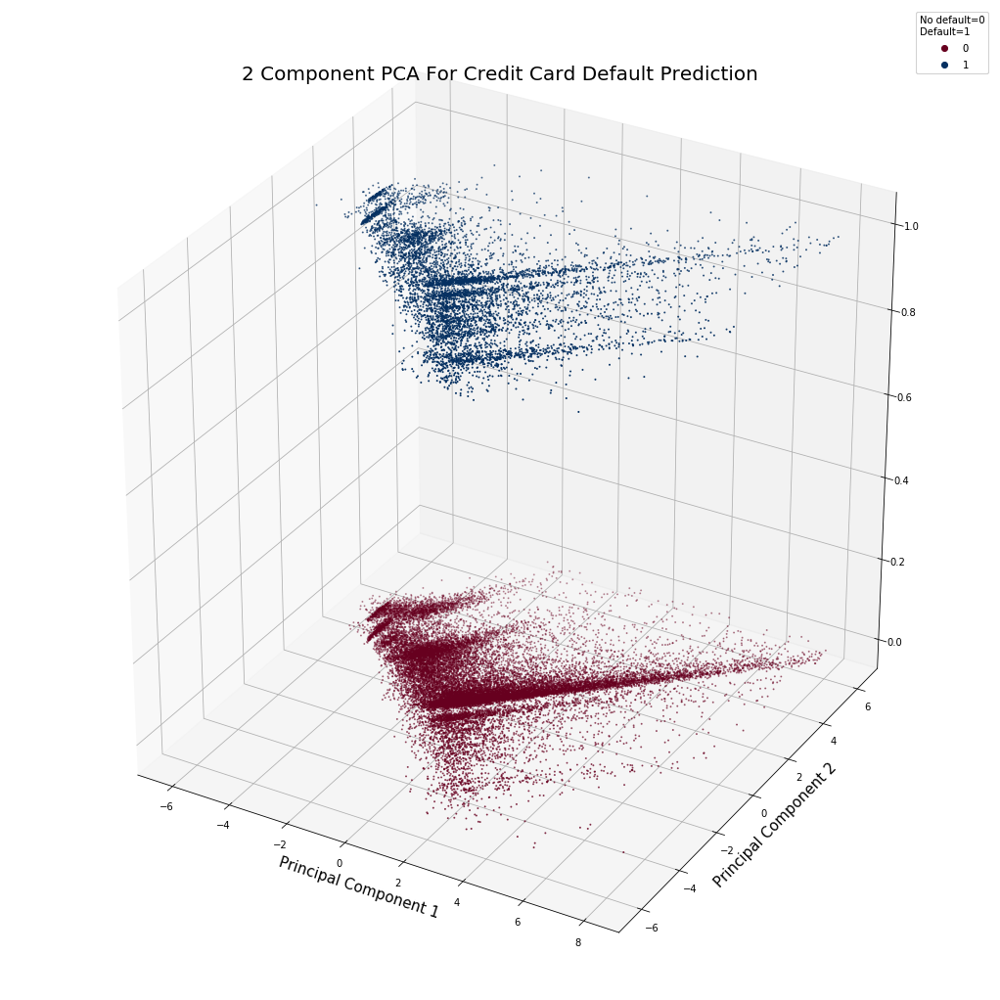

In [10]:
fig = plt.figure(1, figsize=(14, 14))
ax = Axes3D(fig)
ax.scatter(
    finalDF_2.loc[:,'principal component 1'],
    finalDF_2.loc[:,'principal component 2'],
    finalDF_2.loc[:,'default payment next month'],
    c = finalDF_2.loc[:,'default payment next month'],
    cmap = colrMap,
    s = 1,
)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA For Credit Card Default Prediction', fontsize = 20)
ax.grid()
legend1 = ax.legend(*scatter.legend_elements(), title="No default=0\nDefault=1")
ax.add_artist(legend1)
plt.show()

### How much information did we lose in PCA reduction?

As we reduce dimensionality, we lose information. Explained variance tells us how much information (variance) can be attribute to each of the principal components. Using the attribute "explained_variance_ratio" allows us to see the difference in variance. 30.12% of the information in (q1) 18.06% of the information in (q2) Rest of the compoenents contain the rest of the information, so as we go down in dimension, we lose info.

So logically, we should include (q3) since it would increase how much information we have, but as we'll see, not much variance is encapsulated in increase D' to 3 from 2.

When we do this, we only gain 6% more information compared to the origional dataset. In total, we can visualize 54% of the information in the data.

In [11]:
dimensionalVarianceRatios = pca_2.explained_variance_ratio_
print(dimensionalVarianceRatios)

[0.30129908 0.18060988]


[0.30129908 0.18060988 0.0628491 ]


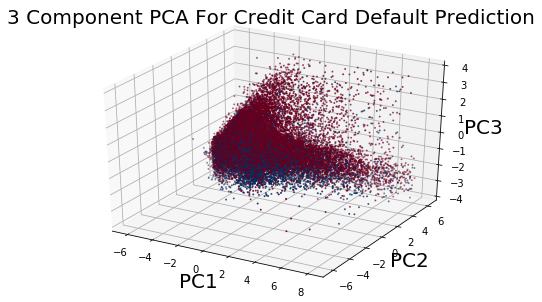

In [12]:
pca_3 = PCA(n_components=3)
principalComponents_3 = pca_3.fit_transform(x)
principalDF_3 = pd.DataFrame(
    data = principalComponents_3,
    columns = ['principal component 1','principal component 2','principal component 3']
)

finalDF_3 = pd.concat([principalDF_3, df[['default payment next month']]], axis=1)
finalDF_3 = finalDF_3[(np.abs(stats.zscore(finalDF_3)) < 2.9).all(axis=1)]

fig = plt.figure()
ax = Axes3D(fig)
ax.set_title('3 Component PCA For Credit Card Default Prediction', fontsize = 20)
colrMap = 'RdBu'
ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_zlabel('PC3', fontsize=20)
ax.scatter(
    finalDF_3.loc[:,'principal component 1'],finalDF_3.loc[:,'principal component 2'],finalDF_3.loc[:,'principal component 3'],
    c = finalDF_3.loc[:,'default payment next month'],
    cmap = colrMap,
    s = 1
)
ax.grid()

dimensionalVarianceRatios = pca_3.explained_variance_ratio_
print(dimensionalVarianceRatios)

plt.show()

### We can also view the clusters about different axes

The first cell will rotate about PC1,\
The second cell will rotate about PC2,\
The third cell will rotate about both at the same time.

In the 3D representation, it looks like there are 2 distinct clusters. The blue cluster is the cluster of defaulters, wheras the red dots are non-defaulters. The red dots 'surround' the cluster of blue dots, with a slight overlap between the two clusters. The blue dots also have lower values of PC2 and are close to the PC3 plane. They are also lower on the PC3 axis, wheras red dots are typically higher on the PC2 and PC3 axis. Along the PC1 axis, the two targets are jumbled up. We also see that, looking towards the PC3 axis, such that we see PC1 and PC2 as an X,Y plane, we can see distinct spikes formed by the two different targets.

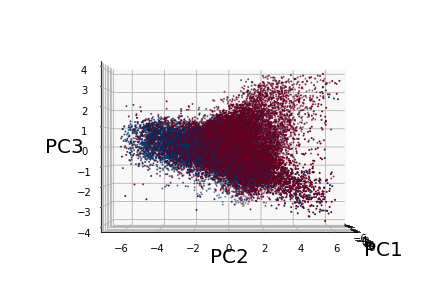

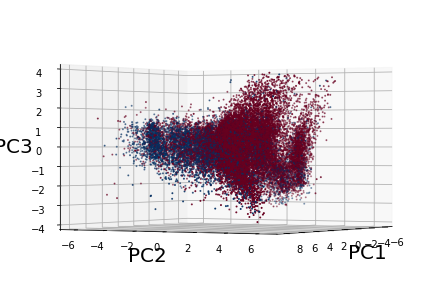

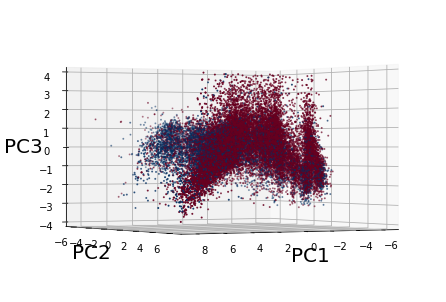

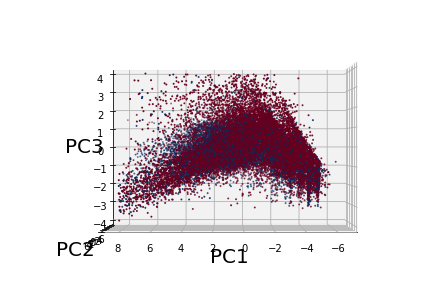

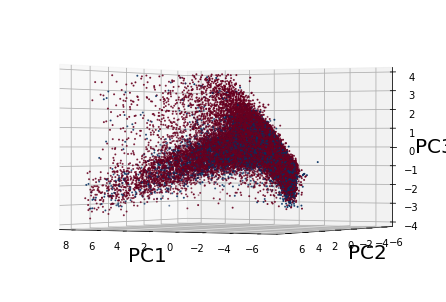

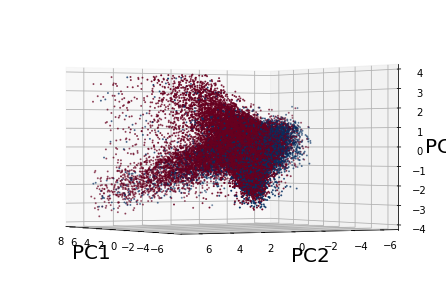

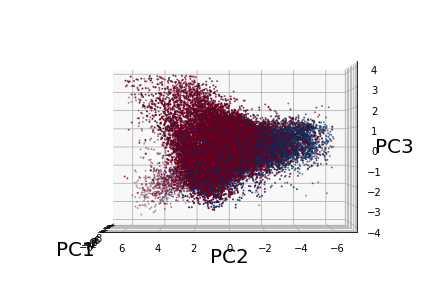

In [13]:
for i in range(0,181,30):
    show(finalDF_3, float(i), 0)

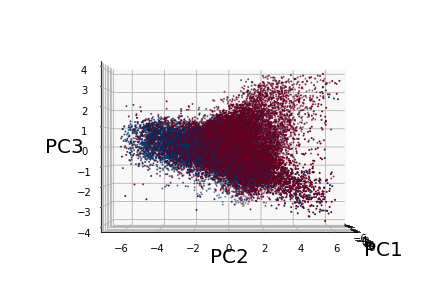

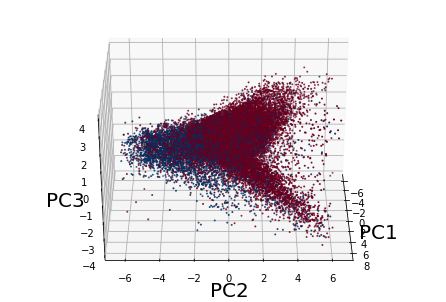

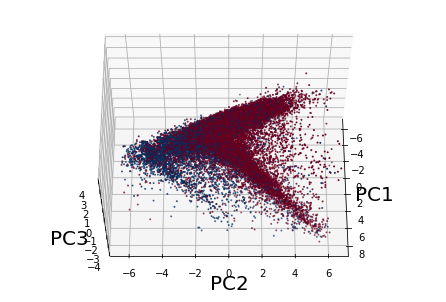

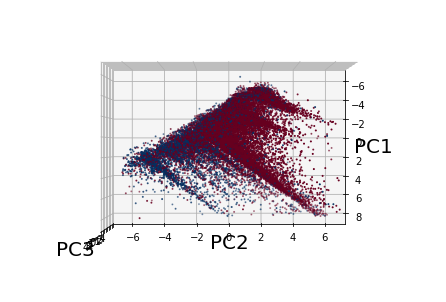

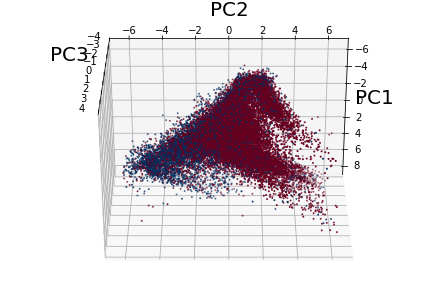

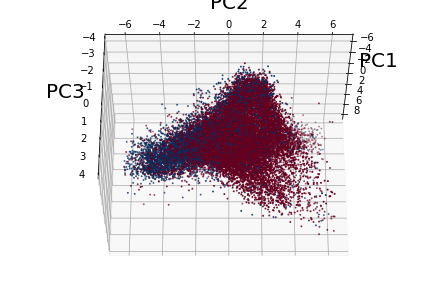

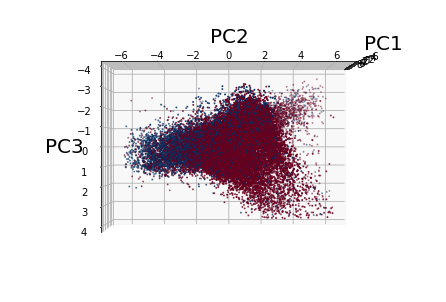

In [14]:
for i in range(0,181,30):
    show(finalDF_3, 0., i)

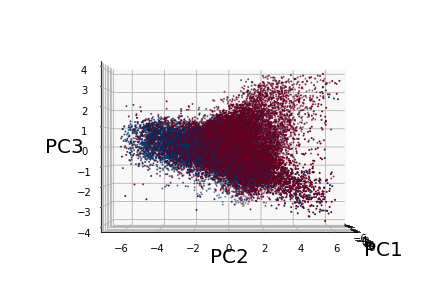

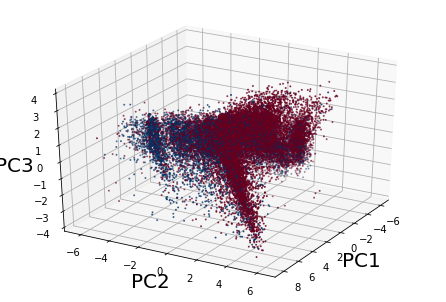

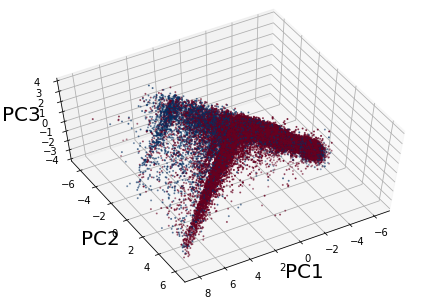

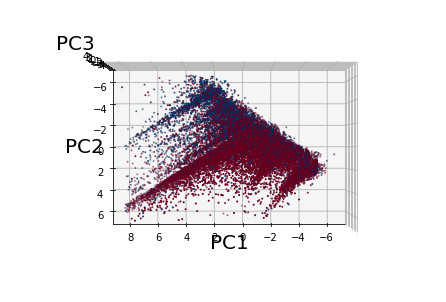

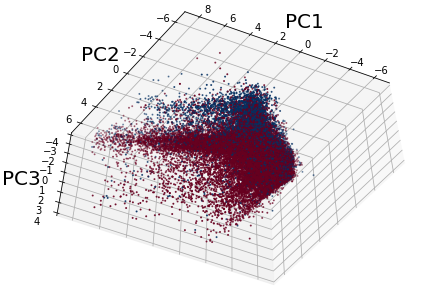

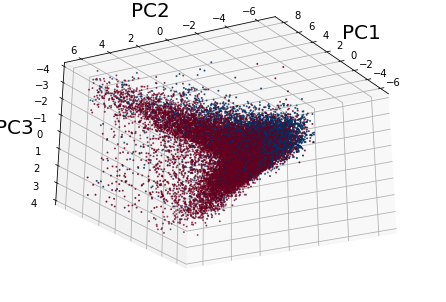

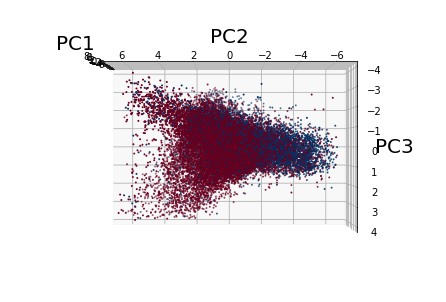

In [15]:
for i in range(0,181,30):
    show(finalDF_3, float(i), i)

## Final exploratory task: Clustering

We will cluster K-Means and DB-Scan.

Unfortunately, the results from clustering where slightly underwhelming as we're able to draw limited insight into the clusters. The clusters simply represent individuals with similar financial data. In addition, based on the 3D data shown above, it appeared as though there may be 2 big clusters representing individuals which defaulted, and individuals that did not. These two statements motivated the thought that clustering and visualization of the clusters may be able to help display distinct groups containing clusters of individuals who defaulted, and individuals that did not.

Based on the results below, this was not the case. My hypothesis is that this is due to the fact that the clustering algorithms group individuals with similar PCA reduced filters, yet since we lose information in PCA reduction, it becomes difficult to decide whether an individual will default or not simply based on proximity to other datapoints. A better predictor would be to analyze the actual values of the features using classification algorithms or regression models to make predictions.


### 1) Clustering on PCA: n=2 data

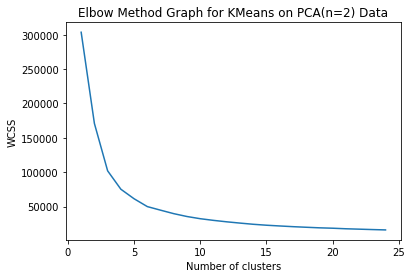

In [16]:
x_2 = finalDF_2.to_numpy()
y_2 = finalDF_2.iloc[:,-1].to_numpy()
wcss=[]
rng = range(1,25)
for i in rng:
    kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=150, random_state=20 )
    kmeans.fit(x_2)
    wcss.append(kmeans.inertia_)
plt.plot(rng,wcss)
plt.title('Elbow Method Graph for KMeans on PCA(n=2) Data')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

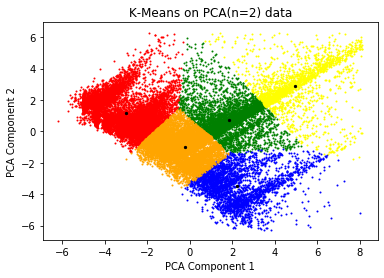

<Figure size 1296x1296 with 0 Axes>

In [17]:
kmeans_2 = KMeans(n_clusters=5, init ='k-means++', max_iter=150, random_state=20)
y_kmeans_2 = kmeans_2.fit_predict(x_2)
colors = ['red','green','blue','orange','yellow']
for i in range(5):
    plt.scatter(x_2[y_kmeans_2==i, 0], x_2[y_kmeans_2==i, 1], s=1, c=colors[i], label ='Cluster '+str(i))

plt.scatter(kmeans_2.cluster_centers_[:, 0], kmeans_2.cluster_centers_[:, 1], s=5, c='black', label = 'Centroids')
plt.title('K-Means on PCA(n=2) data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.figure(figsize=(18,18))
plt.show()

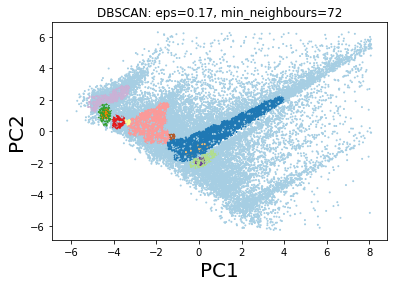

In [18]:
def dbscan(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    db.fit(X)
    y_pred = db.fit_predict(X)
    plt.xlabel('PC1', fontsize=20)
    plt.ylabel('PC2', fontsize=20)
    plt.scatter(X[:,0], X[:,1],c=y_pred, cmap='Paired', s=1)
    plt.title(f'DBSCAN: eps={eps}, min_neighbours={min_samples}')
    plt.show()

dbscan(x_2, 0.17, 72)

### 2) Clustering on n=3 data

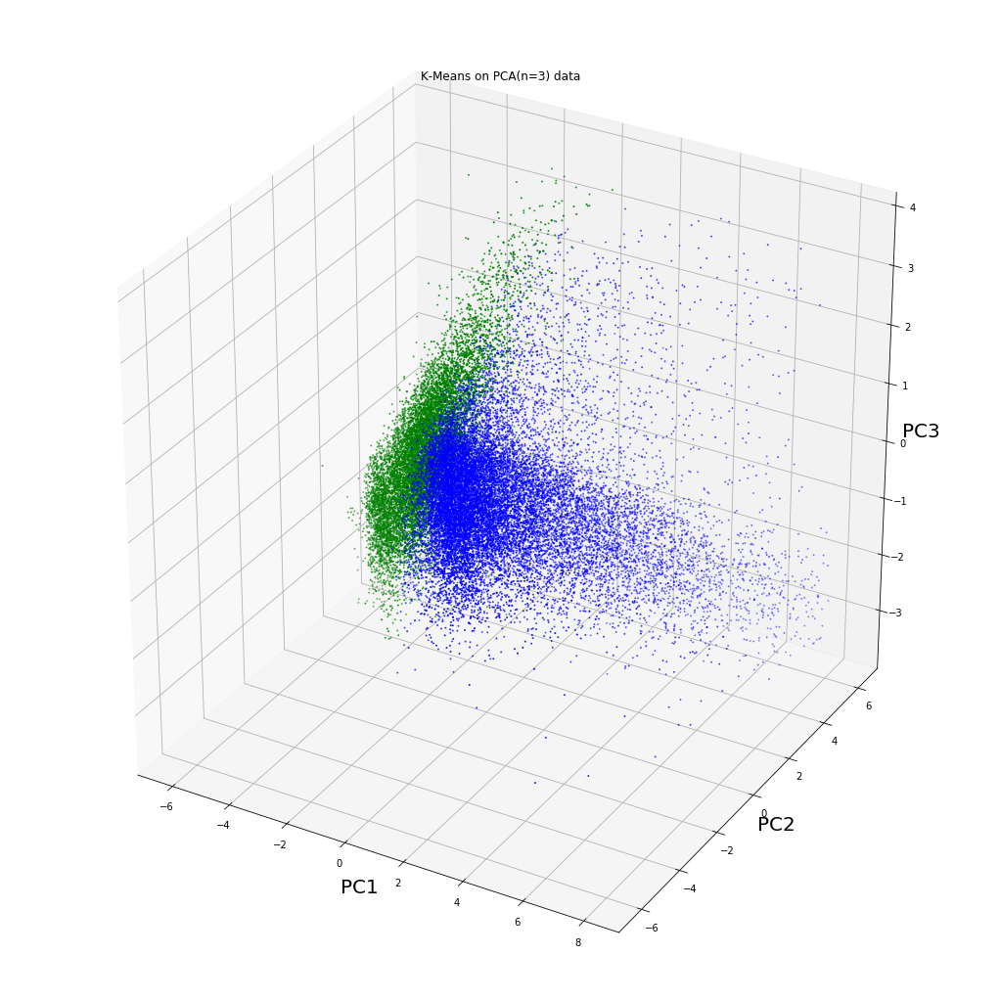

<Figure size 1296x1296 with 0 Axes>

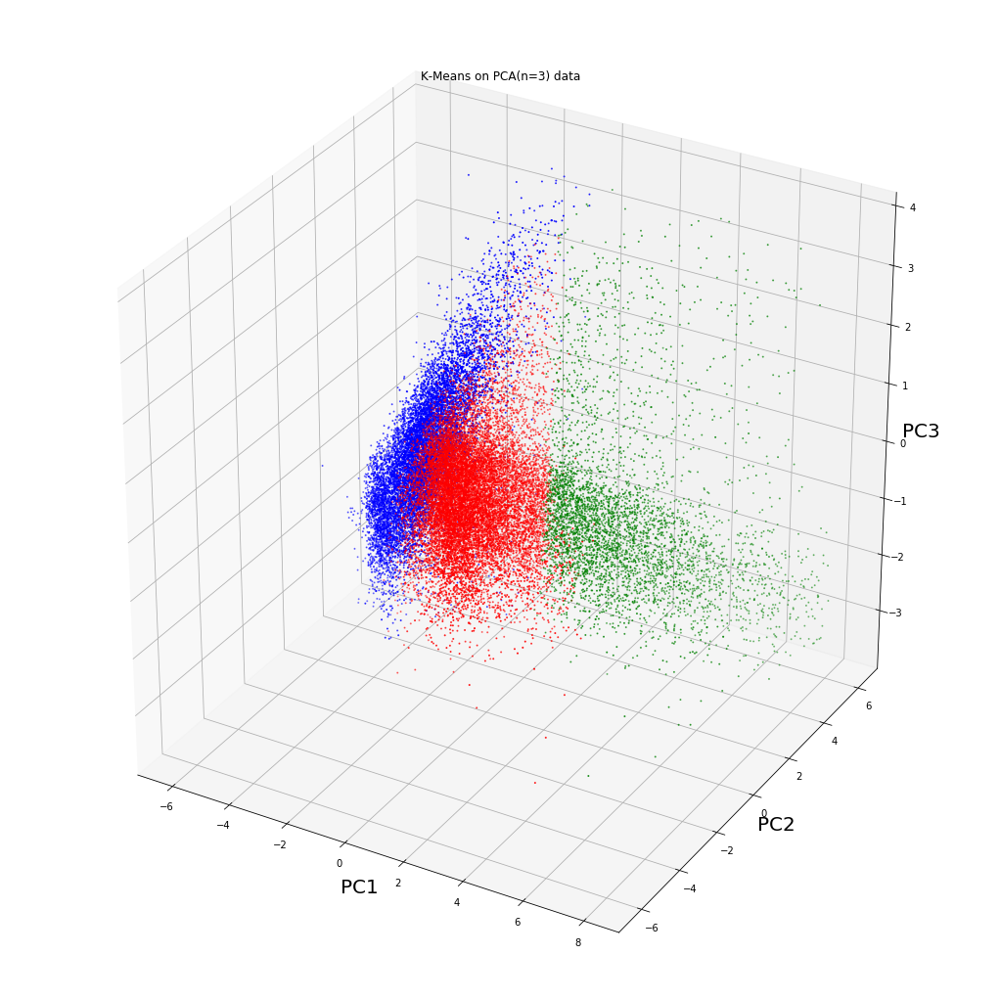

<Figure size 1296x1296 with 0 Axes>

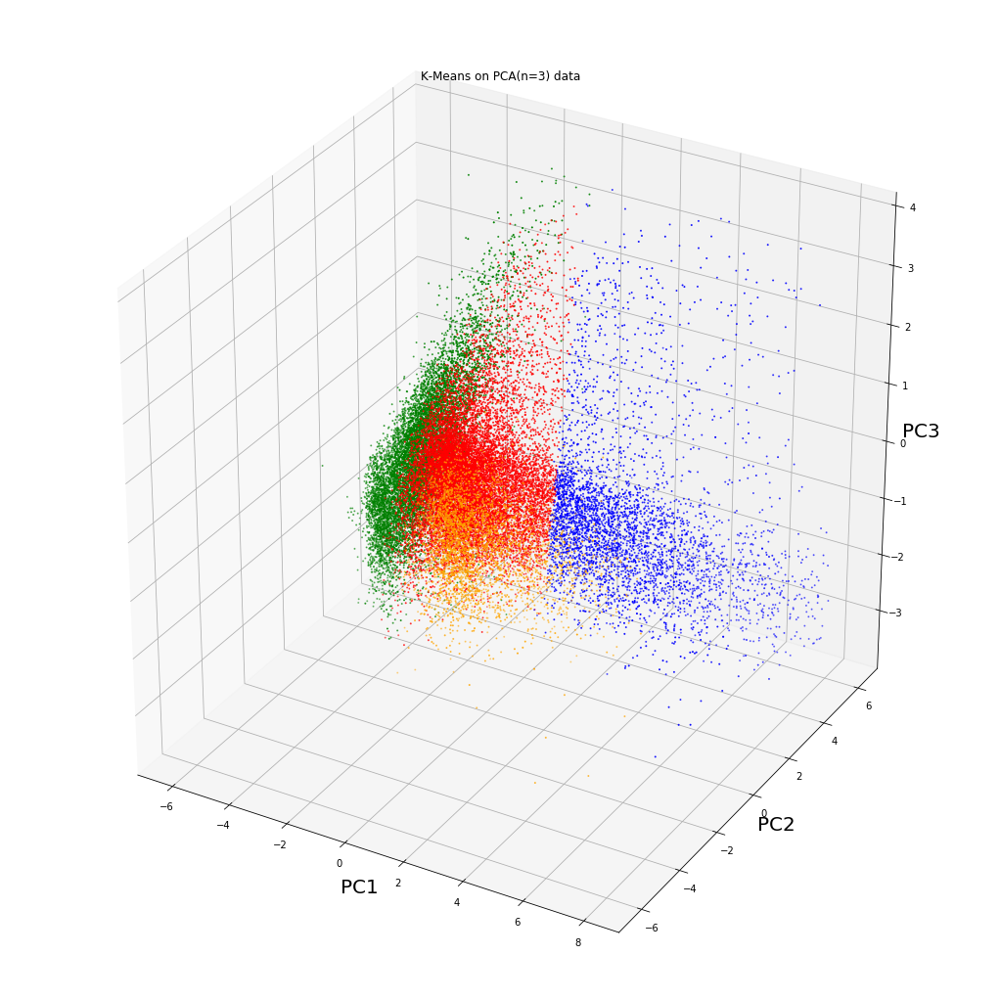

<Figure size 1296x1296 with 0 Axes>

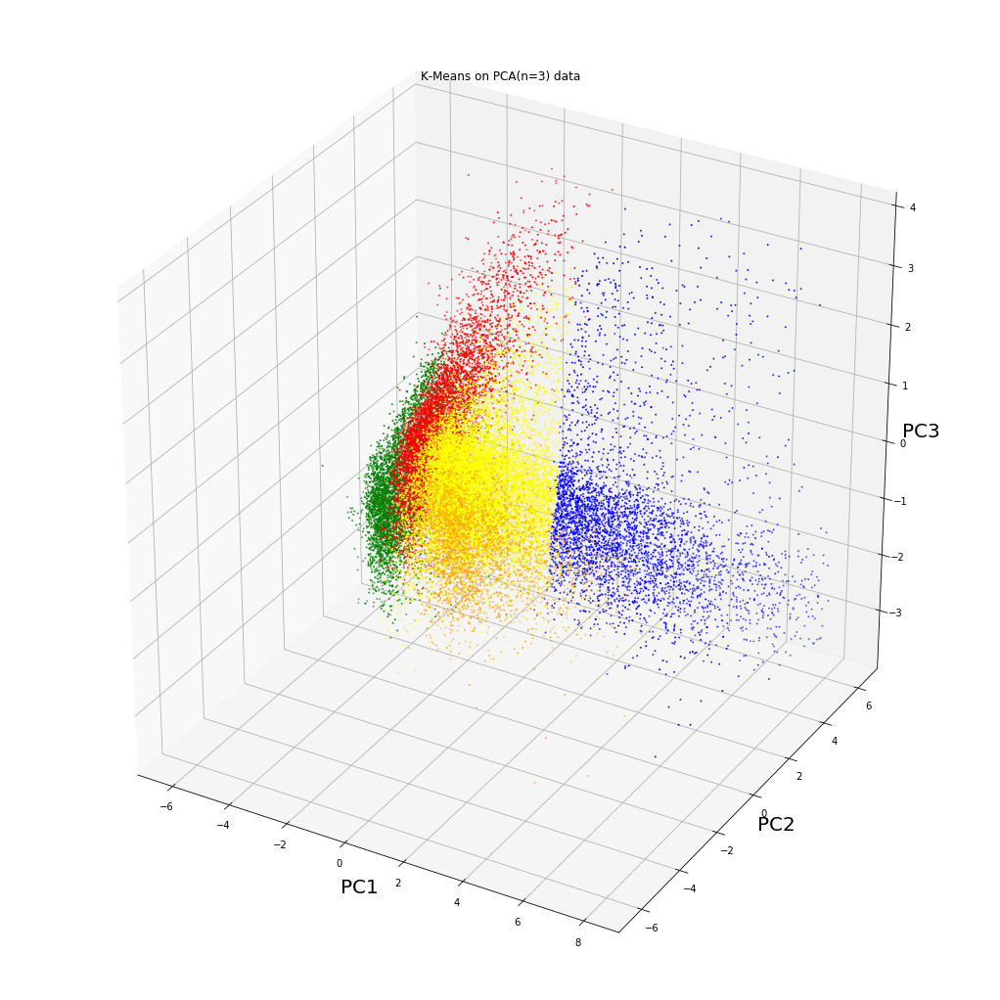

<Figure size 1296x1296 with 0 Axes>

In [19]:
pca_3 = PCA(n_components=3)
principalComponents_3 = pca_3.fit_transform(x)
principalDF_3 = pd.DataFrame(
    data = principalComponents_3,
    columns = ['principal component 1','principal component 2','principal component 3']
)
finalDF_3 = pd.concat([principalDF_3, df[['default payment next month']]], axis=1)
finalDF_3 = finalDF_3[(np.abs(stats.zscore(finalDF_3)) < 2.9).all(axis=1)]

x_3 = finalDF_3.to_numpy()
y_3 = finalDF_3.iloc[:,-1].to_numpy()

colors = ['blue','green','red','orange','yellow']    

for k in range(2,6):
    kmeans_3 = KMeans(n_clusters=k, init ='k-means++', max_iter=150, random_state=20)
    y_kmeans_3 = kmeans_3.fit_predict(x_3)

    fig = plt.figure(1, figsize=(14, 14))
    ax = Axes3D(fig)
    
    for i in range(k):
        ax.scatter(x_3[y_kmeans_3==i, 0], x_3[y_kmeans_3==i, 1], x_3[y_kmeans_3==i, 2],s=1, c=colors[i], label ='Cluster '+str(i))

    plt.title('K-Means on PCA(n=3) data')
    ax.set_xlabel('PC1', fontsize=20)
    ax.set_ylabel('PC2', fontsize=20)
    ax.set_zlabel('PC3', fontsize=20)
    plt.figure(figsize=(18,18))
    plt.show()

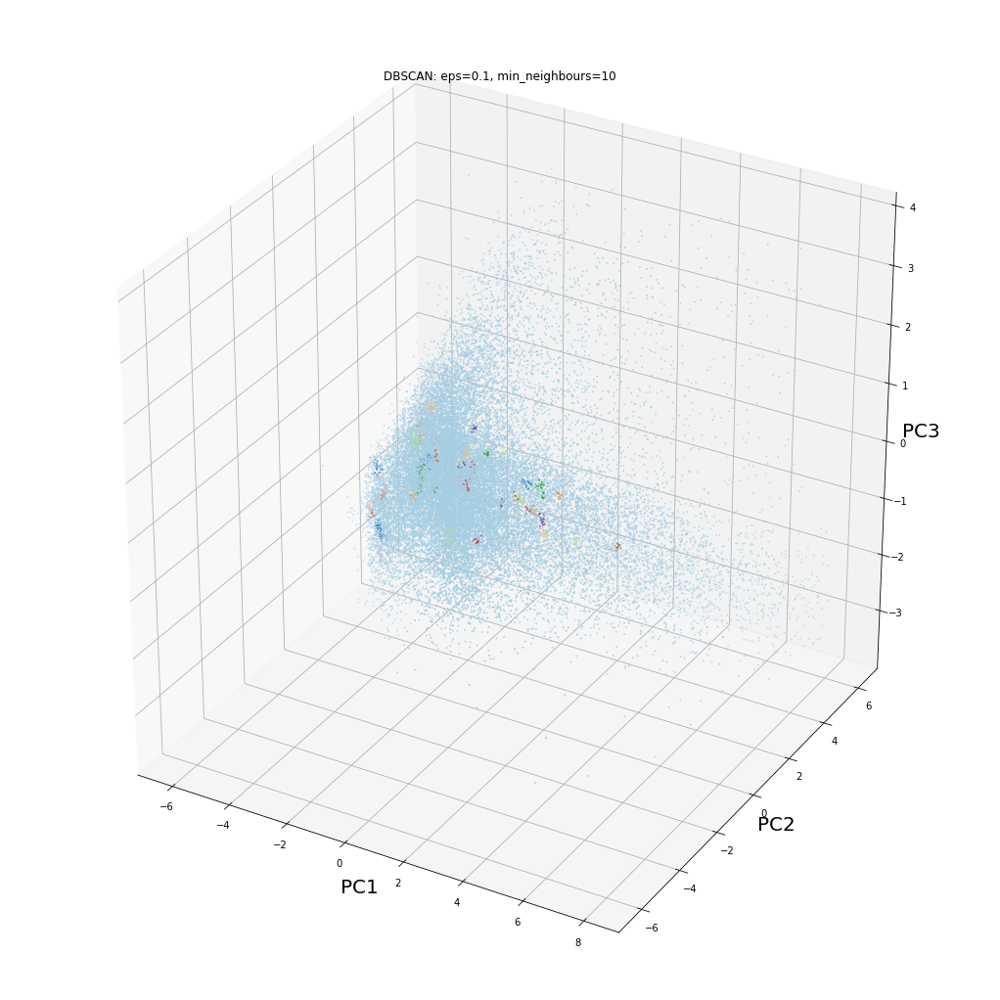

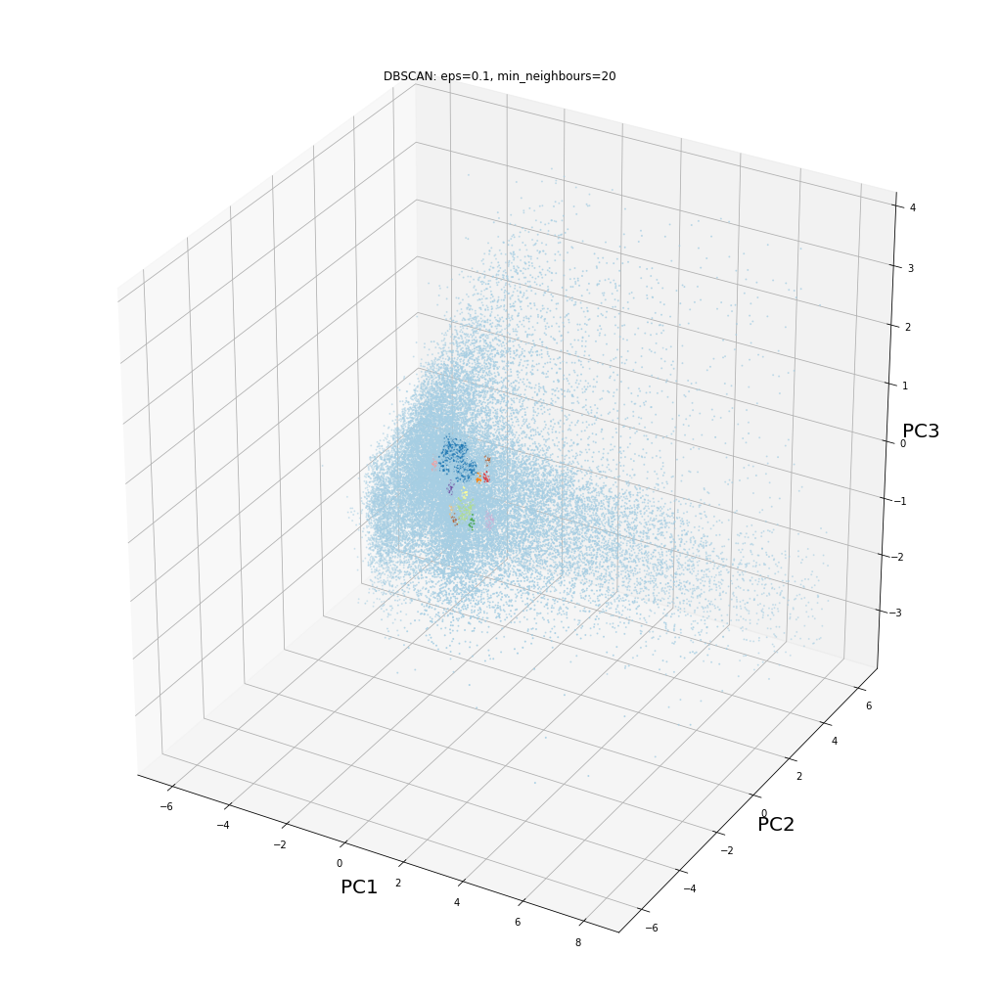

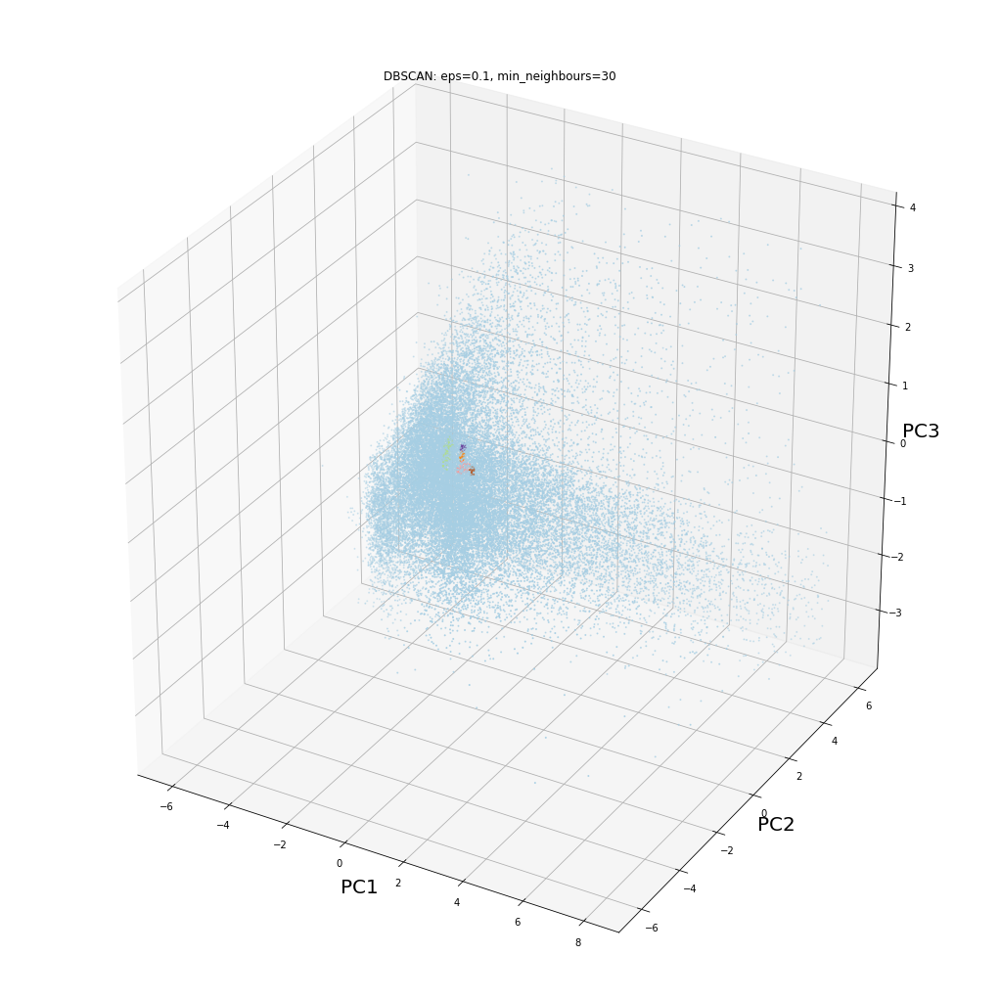

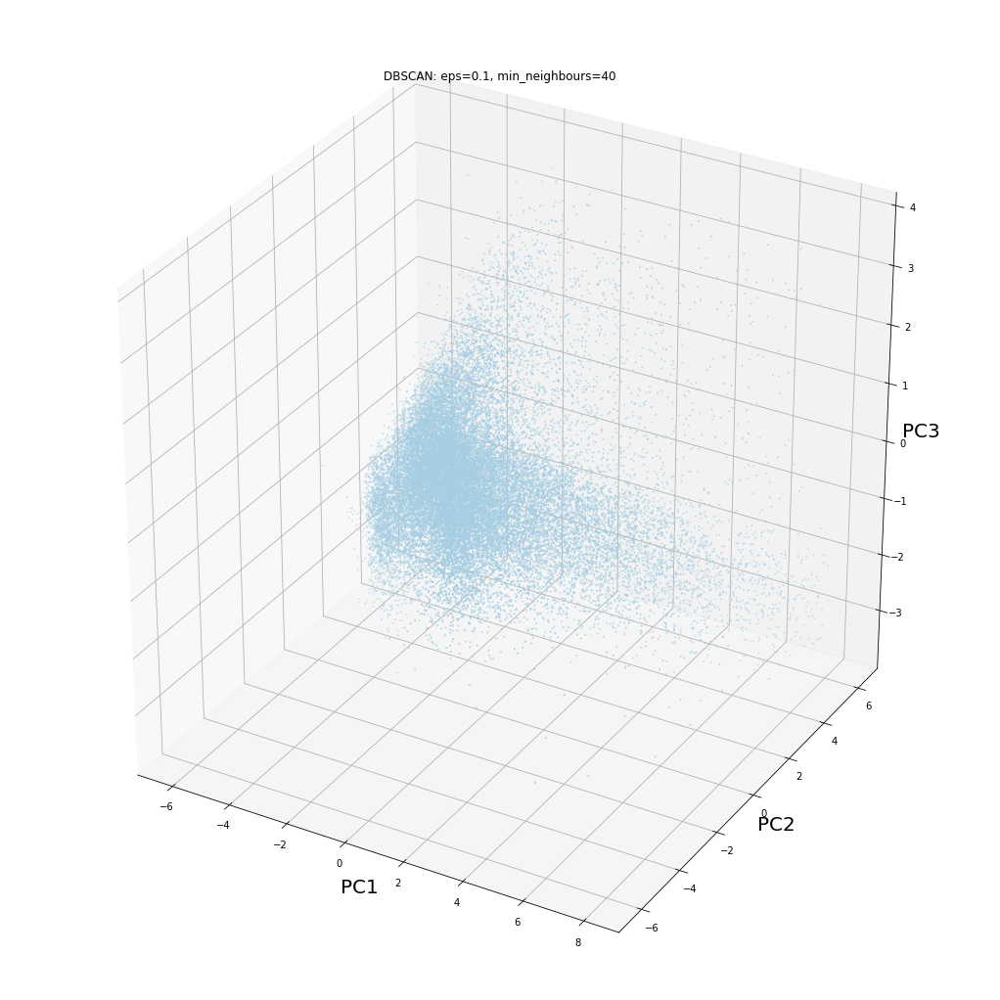

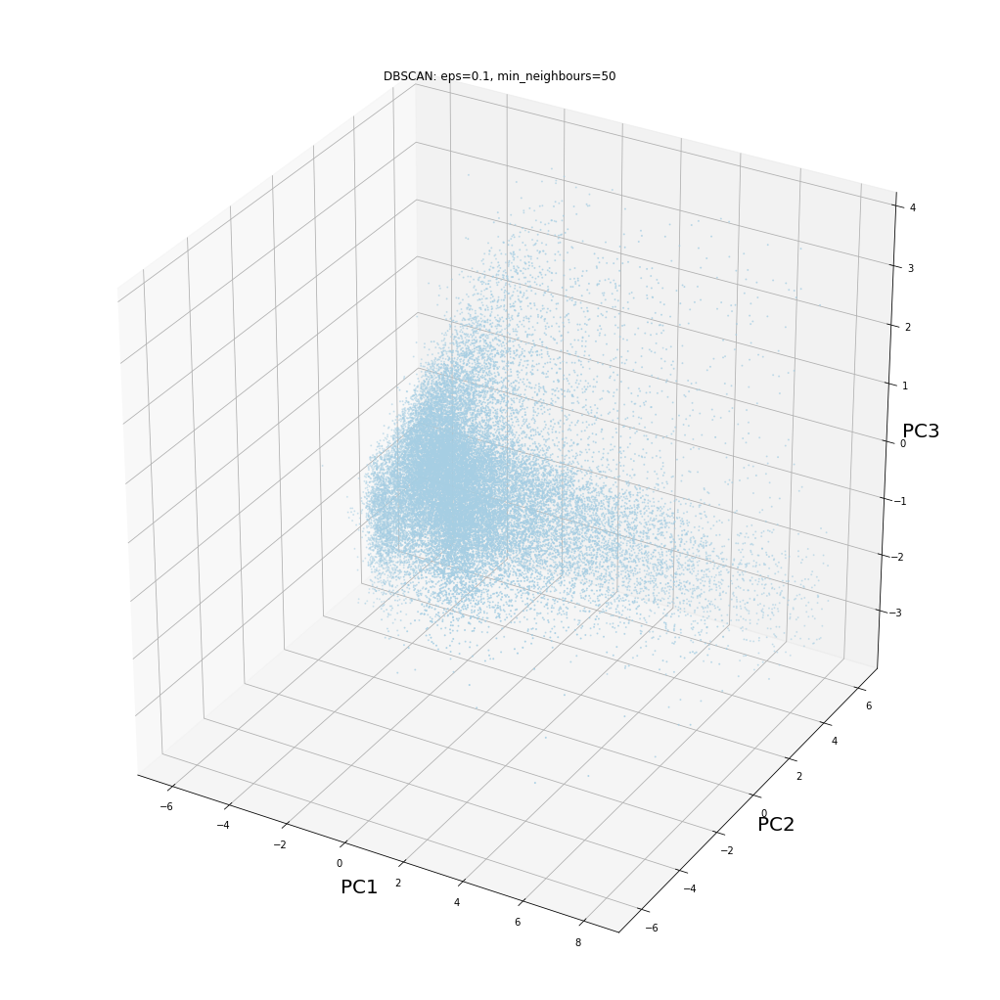

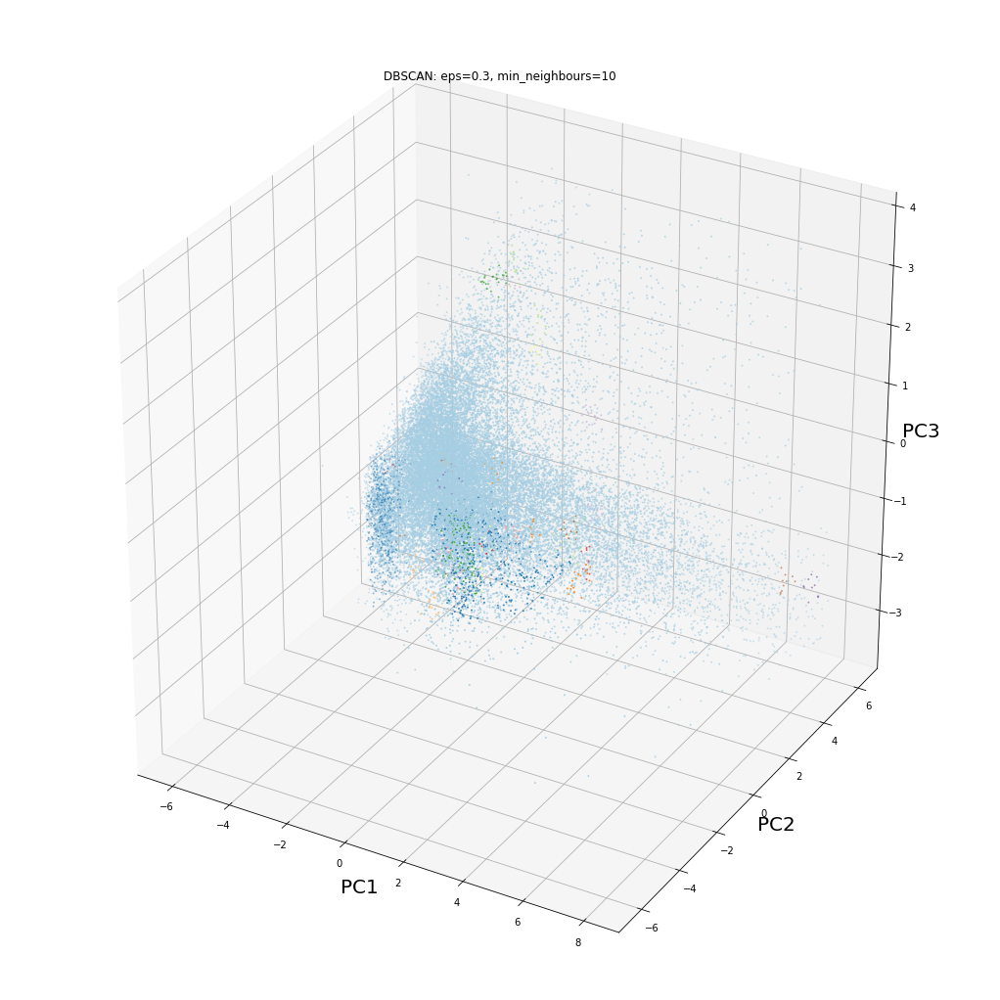

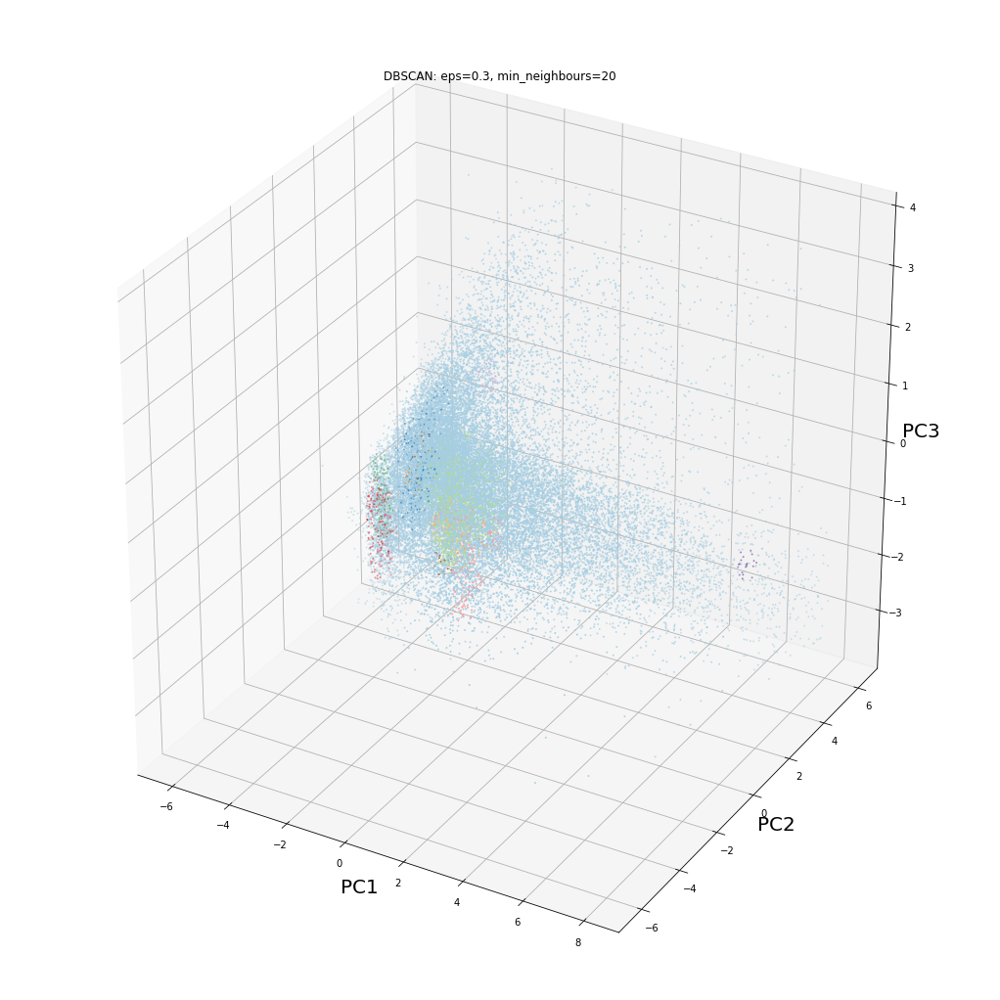

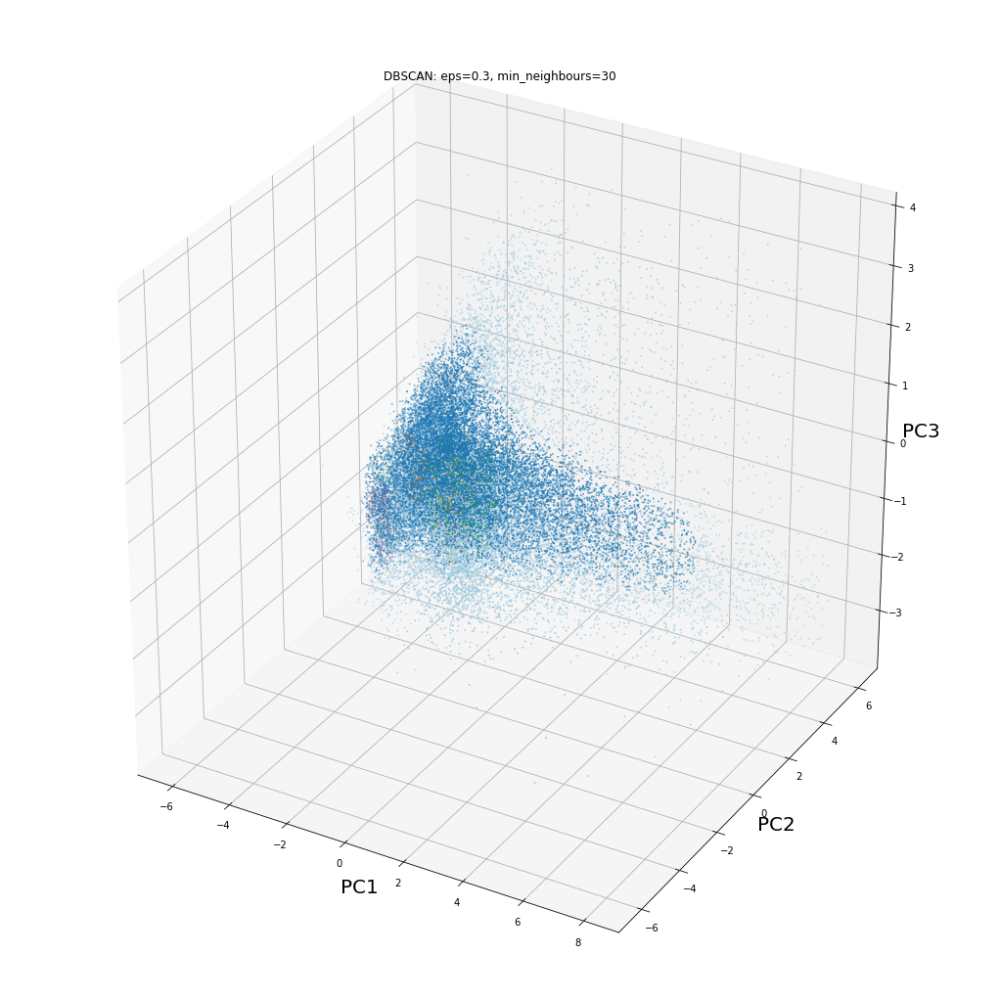

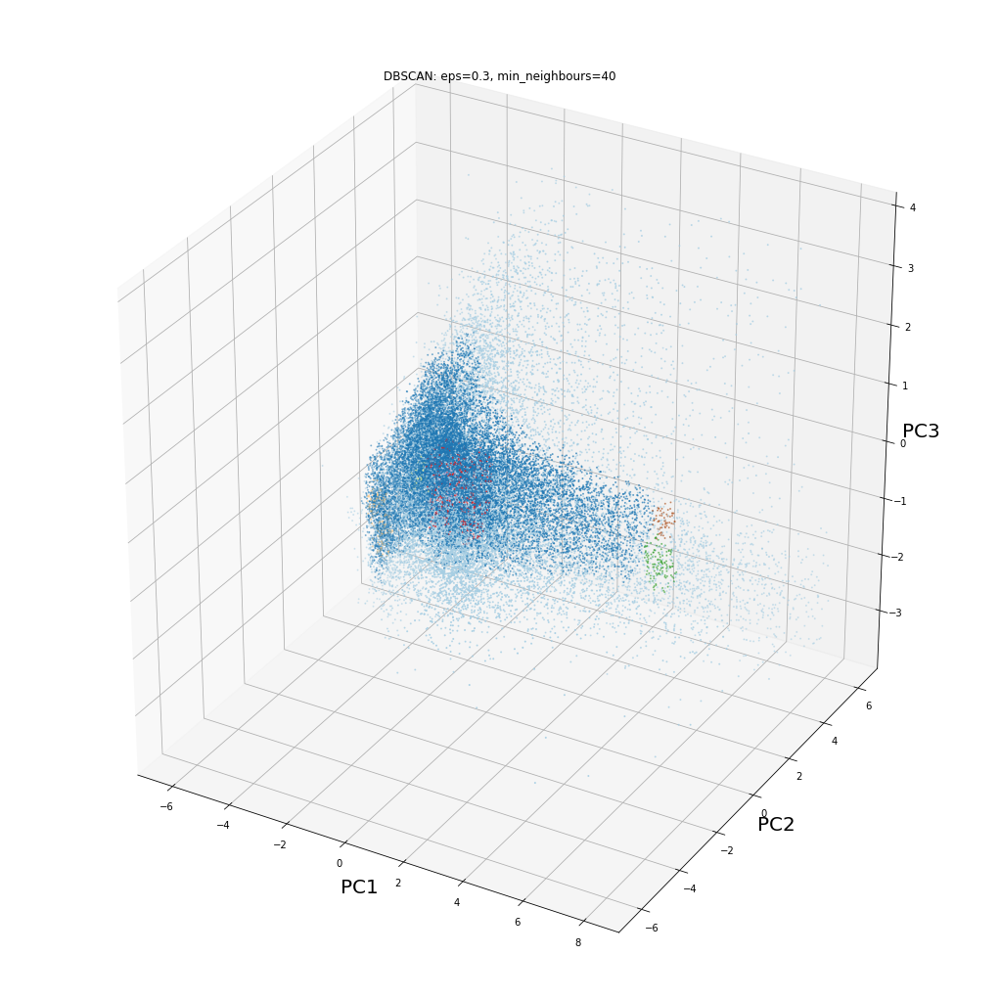

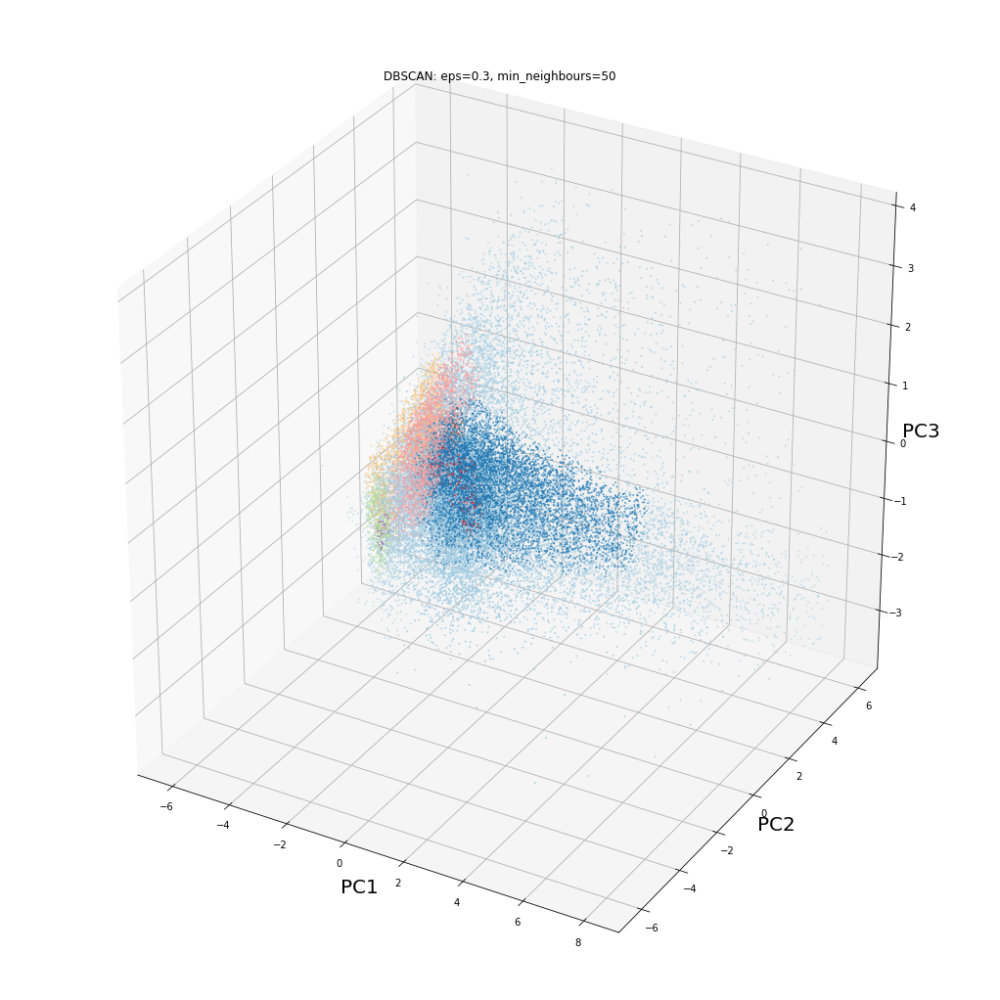

In [20]:
def dbscan3(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    db.fit(X)
    y_pred = db.fit_predict(X)
    fig = plt.figure(1, figsize=(14, 14))
    ax = Axes3D(fig)
    ax.set_xlabel('PC1', fontsize=20)
    ax.set_ylabel('PC2', fontsize=20)
    ax.set_zlabel('PC3', fontsize=20)
    ax.scatter(X[:,0], X[:,1], X[:,2], c=y_pred, cmap='Paired', s=1)
    plt.title(f'DBSCAN: eps={eps}, min_neighbours={min_samples}')
    plt.show()

for i in range(1,5,2):
    for j in range(10,60,10):
        dbscan3(x_3, i/10, j)